# Model Optimisation & Evaluation

**Outline**
* Imported data from Model Testing.
* Processed lyrics within dataset to TfidfVector matrix and concatinated it to the dataset.
* Optimised Random Forest by applying a balanced class weight and feature reduction.
* Enriched dataset and applied same modeling strategy.
* Evaluated the model of the original dataset and the enriched dataset by:
    1. accuracy
    2. precision 
    3. recall
    4. F1 score
    5. ROC-AUC
    6. Precision-Recall-AUC
* Feature importance was determined for both models.

<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Imports" data-toc-modified-id="Imports-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Imports</a></span></li><li><span><a href="#Functions" data-toc-modified-id="Functions-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Functions</a></span></li><li><span><a href="#Model-Optimisation" data-toc-modified-id="Model-Optimisation-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Model Optimisation</a></span></li><li><span><a href="#Model-Evaluation" data-toc-modified-id="Model-Evaluation-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>Model Evaluation</a></span></li><li><span><a href="#Increased-Dataset-to-1615-Total-Rows" data-toc-modified-id="Increased-Dataset-to-1615-Total-Rows-5"><span class="toc-item-num">5&nbsp;&nbsp;</span>Increased Dataset to 1615 Total Rows</a></span><ul class="toc-item"><li><span><a href="#Random-Forest-Summariaed-Optimisation" data-toc-modified-id="Random-Forest-Summariaed-Optimisation-5.1"><span class="toc-item-num">5.1&nbsp;&nbsp;</span>Random Forest Summariaed Optimisation</a></span></li><li><span><a href="#Evaluation" data-toc-modified-id="Evaluation-5.2"><span class="toc-item-num">5.2&nbsp;&nbsp;</span>Evaluation</a></span></li></ul></li><li><span><a href="#Summary" data-toc-modified-id="Summary-6"><span class="toc-item-num">6&nbsp;&nbsp;</span>Summary</a></span></li></ul></div>

## Imports

**Basics**

In [1]:
import numpy as np
import pandas as pd

In [2]:
import warnings
warnings.filterwarnings('ignore')

**NLP**

In [3]:
from nltk.corpus import stopwords

In [4]:
from sklearn.feature_extraction.text import CountVectorizer, TfidfTransformer, TfidfVectorizer

**Modeling with sklearn**

In [5]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import PowerTransformer
from sklearn.decomposition import PCA

from sklearn.model_selection import cross_val_score


from sklearn import cluster


from sklearn.model_selection import GridSearchCV
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import AdaBoostClassifier, GradientBoostingClassifier
from sklearn.naive_bayes import MultinomialNB, BernoulliNB, GaussianNB
from sklearn.ensemble import RandomForestClassifier
from sklearn.pipeline import Pipeline

from sklearn.svm import SVC, LinearSVC

from sklearn.metrics import confusion_matrix, classification_report
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.metrics import precision_recall_fscore_support
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, roc_auc_score, precision_recall_curve
from sklearn.multiclass import OneVsRestClassifier
from sklearn.metrics import average_precision_score
from sklearn import metrics

**Visualisation**

In [6]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.style.use('ggplot')
sns.set(font_scale=1.5)
%config InlineBackend.figure_format = 'retina'
%matplotlib inline

import scikitplot as skplt
from matplotlib.colors import ListedColormap

## Functions

In [7]:
def StandardScaler_processing(X_train, X_test):
    scaler = StandardScaler()
    
    X_train = pd.DataFrame(scaler.fit_transform(X_train), columns=X_train.columns)
    X_test = pd.DataFrame(scaler.transform(X_test), columns=X_test.columns)
    
    return X_train, X_test

In [8]:
def dummyifying(X, columns):
    X = pd.get_dummies(X, columns=columns, drop_first=True)
    return X

In [9]:
def tvec_processing(processing_column, X_train, y_train, X_test, y_test):
    stop = stopwords.words('english')
    stop += ['oh', 'ah', 've','ll','ooh','oooh','uh','aah','aaah','yeah','bum','na','la','doo','nah', 'eh','pow',
             'di','oo','whoa','naa','em','ga','da','hi','sha','ba','wee']

    tvec = TfidfVectorizer(strip_accents='unicode',
                       stop_words=stop, 
                       ngram_range=(1, 3),
                      max_features=1000,
                      max_df = 0.9,
                      min_df = 0.01,
                      sublinear_tf=True)

    train_matrix_t = tvec.fit_transform(X_train[processing_column])

    
    #remove the lyrics_processed column
    #X_train.drop('lyrics_processed', axis=1, inplace=True)
    
    TVEC_train = pd.DataFrame(train_matrix_t.toarray(),
                  columns=tvec.get_feature_names())
    
    #resetting the X_train index so it can be joined with the CVEC_train
    X_train.reset_index(drop=True, inplace=True)
    
    #resetting the y_train index 
    y_train.reset_index(drop=True, inplace=True)
    
    #joining the dataframe and the cvec_train dataframe
    X_train = pd.concat([X_train, TVEC_train], axis=1, sort=False)
    
    
    test_matrix_t = tvec.transform(X_test[processing_column])
    TVEC_test = pd.DataFrame(test_matrix_t.toarray(),
                  columns=tvec.get_feature_names())
    
    #remove the lyrics_processed column
    #X_test.drop('lyrics_processed', axis=1, inplace=True)
    
    X_test.reset_index(drop=True, inplace=True)
    
    y_test.reset_index(drop=True, inplace=True)

    X_test = pd.concat([X_test, TVEC_test], axis=1, sort=False)
    
    return X_train, y_train, X_test, y_test

In [10]:
def plot_f1_lines(figsize=(8, 6), fontsize=16):
    '''Create f1-score level lines to be added to the precison-recall plot'''

    fig, ax = plt.subplots(figsize=figsize)

    # add lines of constant F1 scores

    for const in np.linspace(0.2, 0.9, 8):
        x_vals = np.linspace(0.001, 0.999, 100)
        y_vals = 1./(2./const-1./x_vals)
        ax.plot(x_vals[y_vals > 0], y_vals[y_vals > 0],
                color='lightblue', ls='--', alpha=0.9)
        ax.set_ylim([0, 1])
        ax.annotate('f1={0:0.1f}'.format(const),
                    xy=(x_vals[-10], y_vals[-2]+0.0), fontsize=fontsize)

    return fig, ax

## Model Optimisation

In [11]:
train_set = pd.read_csv('/Users/constancemaurer/GA DSI 12/DSI12-lessons/projects/project-capstone/personal-github/Resources/train_set.csv')
test_set = pd.read_csv('/Users/constancemaurer/GA DSI 12/DSI12-lessons/projects/project-capstone/personal-github/Resources/test_set.csv')

In [12]:
model_tested = pd.read_csv('/Users/constancemaurer/GA DSI 12/DSI12-lessons/projects/project-capstone/personal-github/Resources/Model_Test_sorted.csv')

**Train and Test Set Preparation**

* Defined train and test set

In [13]:
y_train = train_set.pop('artist_name')
X_train = train_set.copy()

In [14]:
y_test = test_set.pop('artist_name')
X_test = test_set.copy()

* Dummified categorical variables

In [15]:
X_train = dummyifying(X_train, ['key', 'time_signature','mode'])
X_test = dummyifying(X_test, ['key', 'time_signature','mode'])

* Tfidf-vectorized lyrics_processed column

In [16]:
X_train_t, y_train_t, X_test_t, y_test_t = tvec_processing('lyrics_processed', X_train, y_train, X_test, y_test)

In [17]:
X_train_t.drop('lyrics_processed', axis=1, inplace=True)
X_test_t.drop('lyrics_processed', axis=1, inplace=True)

* Standarised X variables

In [18]:
X_train_t, X_test_t = StandardScaler_processing(X_train_t, X_test_t)

In [19]:
model_tested

,Model,Parameters,Processing,Train: Accuracy,Train: Precision,Train: Recall,Train: F1,Test: Accuracy,Test: Precision,Test: Recall,Test: F1,Cross-Val Score
0,Random Forest,"RandomForestClassifier(bootstrap=True, class_w...","StandardScaler(), TfidfVectorizer()",1.000,1.000,1.000,1.000,0.437,0.366,0.341,0.330,0.433
1,Bagging with Decision Tree,BaggingClassifier(base_estimator=DecisionTreeC...,"StandardScaler(), TfidfVectorizer()",1.000,1.000,1.000,1.000,0.426,0.386,0.343,0.338,0.400
2,Logistic Regression L2,"LogisticRegression(C=0.21209508879201905, clas...","StandardScaler(), TfidfVectorizer()",1.000,1.000,1.000,1.000,0.426,0.356,0.336,0.328,0.391
3,"Logistic Regression, Saga Solver","LogisticRegression(C=7.443803013251689, class_...","StandardScaler(), TfidfVectorizer()",1.000,1.000,1.000,1.000,0.433,0.402,0.369,0.363,0.387
4,Linear Support Vector Classifier,"LinearSVC(C=0.001, class_weight=None, dual=Tru...","StandardScaler(), TfidfVectorizer()",0.996,0.997,0.993,0.995,0.388,0.304,0.319,0.299,0.384
5,Linear Support Vector Classifier,"LinearSVC(C=0.001, class_weight=None, dual=Tru...","StandardScaler(), TfidfVectorizer()",0.986,0.993,0.976,0.983,0.350,0.236,0.265,0.235,0.353
6,Bagging with Best Decision Tree,BaggingClassifier(base_estimator=DecisionTreeC...,"StandardScaler(), TfidfVectorizer()",0.700,0.753,0.592,0.613,0.369,0.259,0.264,0.239,0.338
7,Support Vector Classifier - sigmoid,"SVC(C=0.27263157894736845, cache_size=200, cla...","StandardScaler(), TfidfVectorizer()",0.140,0.121,0.107,0.106,0.278,0.221,0.218,0.206,0.302
8,Logistic Regression L1,"LogisticRegression(C=2.442053094548651, class_...","StandardScaler(), TfidfVectorizer()",1.000,1.000,1.000,1.000,0.338,0.305,0.295,0.289,0.293
9,Decision Tree,"DecisionTreeClassifier(class_weight=None, crit...","StandardScaler(), TfidfVectorizer()",0.414,0.366,0.335,0.314,0.247,0.228,0.211,0.197,0.241


* Made an instant of the model from the Model Testing Phase

In [20]:
print(model_tested['Parameters'][0])

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=40, max_features=200, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=500,
                       n_jobs=None, oob_score=False, random_state=42, verbose=0,
                       warm_start=False)


In [21]:
rf = RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=40, max_features=200, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=500,
                       n_jobs=None, oob_score=False, random_state=42, verbose=0,
                       warm_start=False)

In [22]:
rf.fit(X_train_t, y_train_t)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=40, max_features=200, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=500,
                       n_jobs=None, oob_score=False, random_state=42, verbose=0,
                       warm_start=False)

In [23]:
print('Cross validation score:')
print(cross_val_score(rf, X_train_t, y_train_t, cv=5).mean())
print('Training accuracy score:')
print(rf.score(X_train_t, y_train_t))
print('Testing accuracy score:')
print(rf.score(X_test_t, y_test_t))

Cross validation score:
0.4332659979494203
Training accuracy score:
1.0
Testing accuracy score:
0.4372623574144487


* **Ran GridSearch by including Min_leaf**

In [24]:
random_forest = RandomForestClassifier(random_state=42)

In [25]:
params = {'class_weight':[None],
         'n_estimators':[500],
         'criterion': ['gini'],
         'max_depth': [None, 10, 40, 100],
         'max_features': [None, 200, 500, 750],
         'min_samples_leaf':[1,50]}

In [26]:
random_grid = GridSearchCV(random_forest,
                           param_grid=params,
                           scoring='accuracy',
                           cv=5,
                           n_jobs=2,
                           verbose=1,
                           iid=False)
random_grid.fit(X_train_t, y_train_t)
random_grid.best_estimator_

Fitting 5 folds for each of 32 candidates, totalling 160 fits


[Parallel(n_jobs=2)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  46 tasks      | elapsed:  5.3min
[Parallel(n_jobs=2)]: Done 160 out of 160 | elapsed: 16.0min finished


RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features=200, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=500,
                       n_jobs=None, oob_score=False, random_state=42, verbose=0,
                       warm_start=False)

In [27]:
best_leaf = random_grid.best_estimator_

In [28]:
print()
print('Cross validation score:  ' , cross_val_score(best_leaf, X_train_t, y_train_t, cv=5, scoring='accuracy').mean())
print()
print('Training accuracy score:  ', best_leaf.score(X_train_t, y_train_t))
print()
print('Testing accuracy score:  ', best_leaf.score(X_test_t, y_test_t))


Cross validation score:   0.43584689619699013

Training accuracy score:   1.0

Testing accuracy score:   0.4448669201520912


**Running GridSearch by including balanced class weight**

In [29]:
random_forest = RandomForestClassifier(random_state=42)

In [30]:
params = {'class_weight':[None, 'balanced'],
         'n_estimators':[500],
         'criterion': ['gini'],
         'max_depth': [20, 40, 300]+[None],
         'max_features': [None, 200, 500, 750]}

In [31]:
random_grid = GridSearchCV(random_forest,
                           param_grid=params,
                           scoring='accuracy',
                           cv=5,
                           n_jobs=2,
                           verbose=1,
                           iid=False)
random_grid.fit(X_train_t, y_train_t)
random_grid.best_estimator_

Fitting 5 folds for each of 40 candidates, totalling 200 fits


[Parallel(n_jobs=2)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  46 tasks      | elapsed:  6.1min
[Parallel(n_jobs=2)]: Done 196 tasks      | elapsed: 31.0min
[Parallel(n_jobs=2)]: Done 200 out of 200 | elapsed: 32.0min finished


RandomForestClassifier(bootstrap=True, class_weight='balanced',
                       criterion='gini', max_depth=20, max_features=None,
                       max_leaf_nodes=None, min_impurity_decrease=0.0,
                       min_impurity_split=None, min_samples_leaf=1,
                       min_samples_split=2, min_weight_fraction_leaf=0.0,
                       n_estimators=500, n_jobs=None, oob_score=False,
                       random_state=42, verbose=0, warm_start=False)

In [32]:
best_balanced = random_grid.best_estimator_

In [33]:
print()
print('Cross validation score:')
print(cross_val_score(best_balanced, X_train_t, y_train_t, cv=5, scoring='accuracy').mean())
print()
print('Training accuracy score:')
print(best_balanced.score(X_train_t, y_train_t))
print()
print('Testing accuracy score:')
print(best_balanced.score(X_test_t, y_test_t))


Cross validation score:
0.455272670453022

Training accuracy score:
1.0

Testing accuracy score:
0.4524714828897338


* **Determined Feature Importance of the balanced class weight Random Forest model.**

In [34]:
feature_import = pd.DataFrame({
    'feature': np.array(X_train_t.columns),
    'importance': best_balanced.feature_importances_
})

In [35]:
feature_sorted = feature_import.sort_values('importance', ascending=False)[:30]

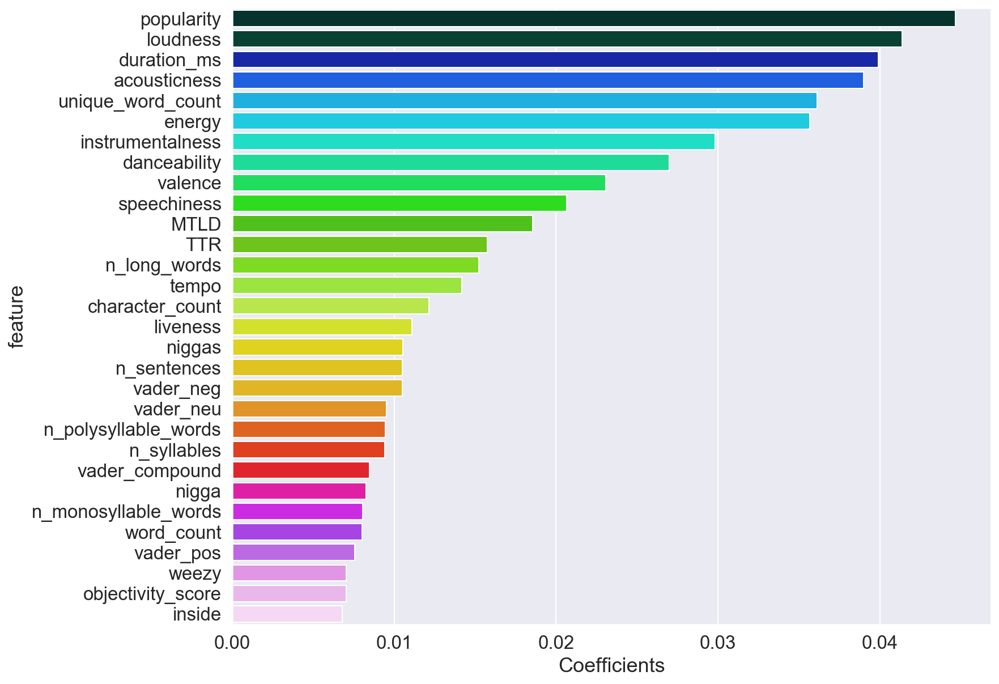

In [36]:
fig, ax = plt.subplots(figsize=(12,10))
sns.barplot(data=feature_sorted, y='feature', x='importance', orient='h', palette='gist_ncar')
ax.set_yticklabels(labels=feature_sorted.feature);
ax.set(xlabel='Coefficients');


* **Reduced features to 750 according to their importance.**

In [37]:
features_list = []
for i in feature_import.sort_values('importance', ascending=False)[:750].feature:
    features_list.append(i)

In [38]:
X_train_750 = X_train_t[features_list]

In [39]:
X_test_750 = X_test_t[features_list]

In [40]:
random_forest = RandomForestClassifier(random_state=42)

In [41]:
params = {'class_weight':['balanced'],
         'n_estimators':[500],
         'criterion': ['gini'],
         'max_depth': [20, 50, 100]+[None],
         'max_features': [None, 10, 100, 200, 300, 500]}

In [42]:
random_grid = GridSearchCV(random_forest,
                           param_grid=params,
                           scoring='accuracy',
                           cv=5,
                           n_jobs=2,
                           verbose=1,
                           iid=False)
random_grid.fit(X_train_750, y_train_t)
random_grid.best_estimator_

Fitting 5 folds for each of 24 candidates, totalling 120 fits


[Parallel(n_jobs=2)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  46 tasks      | elapsed:  6.0min
[Parallel(n_jobs=2)]: Done 120 out of 120 | elapsed: 16.8min finished


RandomForestClassifier(bootstrap=True, class_weight='balanced',
                       criterion='gini', max_depth=50, max_features=100,
                       max_leaf_nodes=None, min_impurity_decrease=0.0,
                       min_impurity_split=None, min_samples_leaf=1,
                       min_samples_split=2, min_weight_fraction_leaf=0.0,
                       n_estimators=500, n_jobs=None, oob_score=False,
                       random_state=42, verbose=0, warm_start=False)

In [43]:
best_750 = random_grid.best_estimator_

In [44]:
print()
print('Cross validation score:  ' , cross_val_score(best_750, X_train_750, y_train, cv=5).mean())
print()
print('Training accuracy score:  ', best_750.score(X_train_750, y_train_t))
print()
print('Testing accuracy score:  ', best_750.score(X_test_750, y_test_t))


Cross validation score:   0.4575334588296224

Training accuracy score:   1.0

Testing accuracy score:   0.467680608365019


* **Reduced features to 500 according to their importance.**

In [45]:
features_list = []
for i in feature_import.sort_values('importance', ascending=False)[:500].feature:
    features_list.append(i)

In [46]:
X_train_500 = X_train_t[features_list]

In [47]:
X_test_500 = X_test_t[features_list]

In [48]:
random_forest = RandomForestClassifier(random_state=42)

In [49]:
params = {'class_weight':['balanced'],
         'n_estimators':[500],
         'criterion': ['gini'],
         'max_depth': [25, 50, 100]+[None],
         'max_features': [None, 100, 200, 300]}

In [50]:
random_grid = GridSearchCV(random_forest, param_grid=params, cv=5, n_jobs=2, verbose=1, iid=False)
random_grid.fit(X_train_500, y_train_t)
random_grid.best_estimator_

Fitting 5 folds for each of 16 candidates, totalling 80 fits


[Parallel(n_jobs=2)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  46 tasks      | elapsed:  6.9min
[Parallel(n_jobs=2)]: Done  80 out of  80 | elapsed: 11.5min finished


RandomForestClassifier(bootstrap=True, class_weight='balanced',
                       criterion='gini', max_depth=100, max_features=100,
                       max_leaf_nodes=None, min_impurity_decrease=0.0,
                       min_impurity_split=None, min_samples_leaf=1,
                       min_samples_split=2, min_weight_fraction_leaf=0.0,
                       n_estimators=500, n_jobs=None, oob_score=False,
                       random_state=42, verbose=0, warm_start=False)

In [51]:
best_500 = random_grid.best_estimator_

In [52]:
print()
print('Cross validation score:  ' , cross_val_score(best_500, X_train_500, y_train_t, cv=5).mean())
print()
print('Training accuracy score:  ', best_500.score(X_train_500, y_train_t))
print()
print('Testing accuracy score:  ', best_500.score(X_test_500, y_test_t))


Cross validation score:   0.45858054985215757

Training accuracy score:   1.0

Testing accuracy score:   0.4600760456273764


* **Reduced features to 250 according to their importance.**

In [53]:
features_list = []
for i in feature_import.sort_values('importance', ascending=False)[:250].feature:
    features_list.append(i)

In [54]:
X_train_250 = X_train_t[features_list]

In [55]:
X_test_250 = X_test_t[features_list]

In [56]:
random_forest = RandomForestClassifier(random_state=42)

In [57]:
params = {'class_weight':['balanced'],
         'n_estimators':[500],
         'criterion': ['gini'],
         'max_depth': [25, 50, 100]+[None],
         'max_features': [None, 100, 200]}

In [58]:
random_grid = GridSearchCV(random_forest, param_grid=params, cv=5, n_jobs=2, verbose=1, iid=False)
random_grid.fit(X_train_250, y_train_t)
random_grid.best_estimator_

Fitting 5 folds for each of 12 candidates, totalling 60 fits


[Parallel(n_jobs=2)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  46 tasks      | elapsed:  6.5min
[Parallel(n_jobs=2)]: Done  60 out of  60 | elapsed:  8.5min finished


RandomForestClassifier(bootstrap=True, class_weight='balanced',
                       criterion='gini', max_depth=50, max_features=200,
                       max_leaf_nodes=None, min_impurity_decrease=0.0,
                       min_impurity_split=None, min_samples_leaf=1,
                       min_samples_split=2, min_weight_fraction_leaf=0.0,
                       n_estimators=500, n_jobs=None, oob_score=False,
                       random_state=42, verbose=0, warm_start=False)

In [59]:
best_250 = random_grid.best_estimator_

In [60]:
print()
print('Cross validation score:  ' , cross_val_score(best_250, X_train_250, y_train_t, cv=5).mean())
print()
print('Training accuracy score:  ', best_250.score(X_train_250, y_train_t))
print()
print('Testing accuracy score:  ', best_250.score(X_test_250, y_test_t))


Cross validation score:   0.4544869620748894

Training accuracy score:   1.0

Testing accuracy score:   0.4524714828897338


## Model Evaluation

* Defined predicted y_train and y_test.

In [61]:
predict_train = best_500.predict(X_train_500)
predict_test = best_500.predict(X_test_500)

* Computed the confusion matrix.

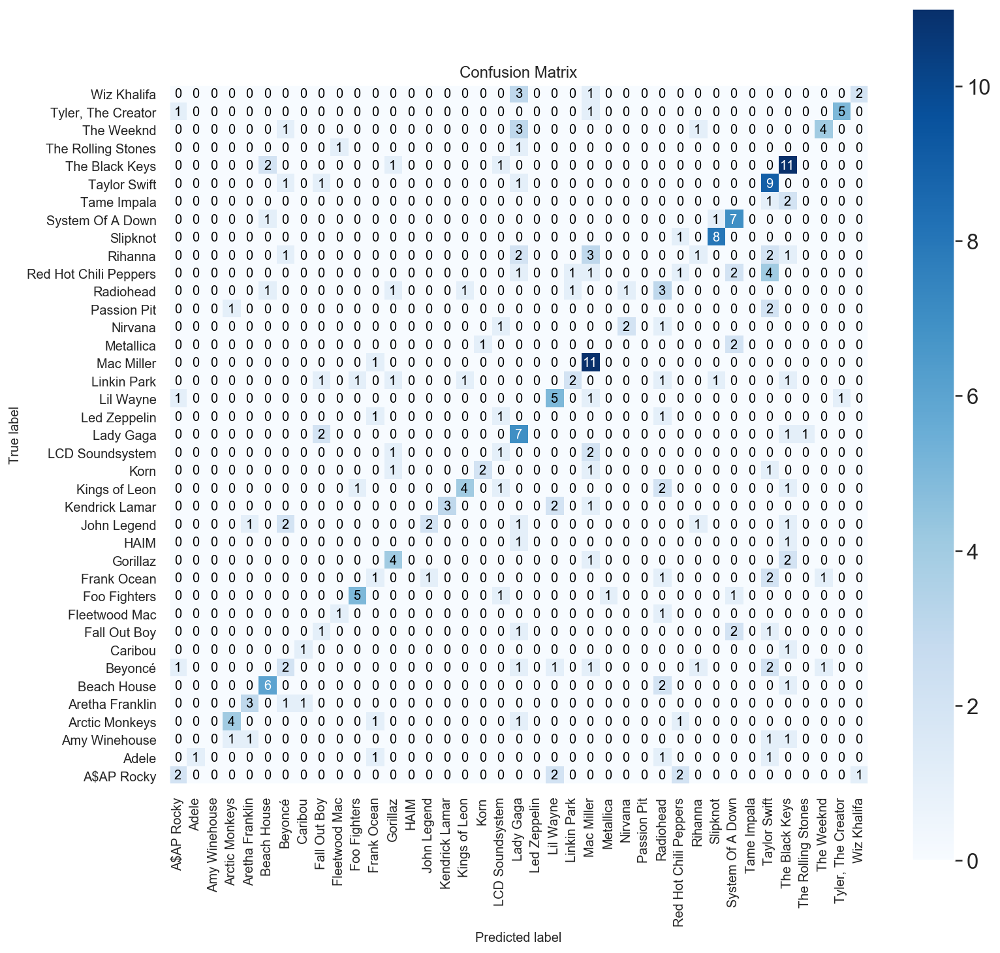

In [62]:
cmap = ListedColormap(sns.color_palette("husl", len(best_500.classes_)))
skplt.metrics.plot_confusion_matrix(y_test_t, predict_test, figsize=(12,12))
plt.ylim([-0.5, len(y_test_t.unique())-0.5])
plt.xticks(rotation=90)
plt.show()

* Computed the classification report.

In [63]:
print(classification_report(y_test_t, predict_test))

                       precision    recall  f1-score   support

           A$AP Rocky       0.40      0.29      0.33         7
                Adele       1.00      0.25      0.40         4
        Amy Winehouse       0.00      0.00      0.00         4
       Arctic Monkeys       0.67      0.57      0.62         7
      Aretha Franklin       0.60      0.60      0.60         5
          Beach House       0.60      0.67      0.63         9
              Beyoncé       0.25      0.20      0.22        10
              Caribou       0.50      0.50      0.50         2
         Fall Out Boy       0.20      0.20      0.20         5
        Fleetwood Mac       0.50      0.50      0.50         2
         Foo Fighters       0.71      0.62      0.67         8
          Frank Ocean       0.20      0.17      0.18         6
             Gorillaz       0.44      0.57      0.50         7
                 HAIM       0.00      0.00      0.00         2
          John Legend       0.67      0.25      0.36  

* Investigated the relationship between songs per artist and the model's precision, recall and F1 score predicting their class.

In [64]:
data = pd.read_csv('/Users/constancemaurer/GA DSI 12/DSI12-lessons/projects/project-capstone/personal-github/Resources/Model_data.csv')

In [65]:
classification_report_table = data.groupby('artist_name').count()[['track_name']]
classification_report_table.reset_index(inplace=True)

In [66]:
precision, recall, f1, support = precision_recall_fscore_support(y_test_t, predict_test, average=None)

In [67]:
classification_report_table['precision_score'] = precision
classification_report_table['recall_score'] = recall
classification_report_table['f1_score'] = f1
classification_report_table['n_samples_test_set'] = support
classification_report_table

,artist_name,track_name,precision_score,recall_score,f1_score,n_samples_test_set
0,A$AP Rocky,33,0.400000,0.285714,0.333333,7
1,Adele,23,1.000000,0.250000,0.400000,4
2,Amy Winehouse,19,0.000000,0.000000,0.000000,4
3,Arctic Monkeys,36,0.666667,0.571429,0.615385,7
4,Aretha Franklin,23,0.600000,0.600000,0.600000,5
5,Beach House,43,0.600000,0.666667,0.631579,9
6,Beyoncé,48,0.250000,0.200000,0.222222,10
7,Caribou,11,0.500000,0.500000,0.500000,2
8,Fall Out Boy,26,0.200000,0.200000,0.200000,5
9,Fleetwood Mac,12,0.500000,0.500000,0.500000,2


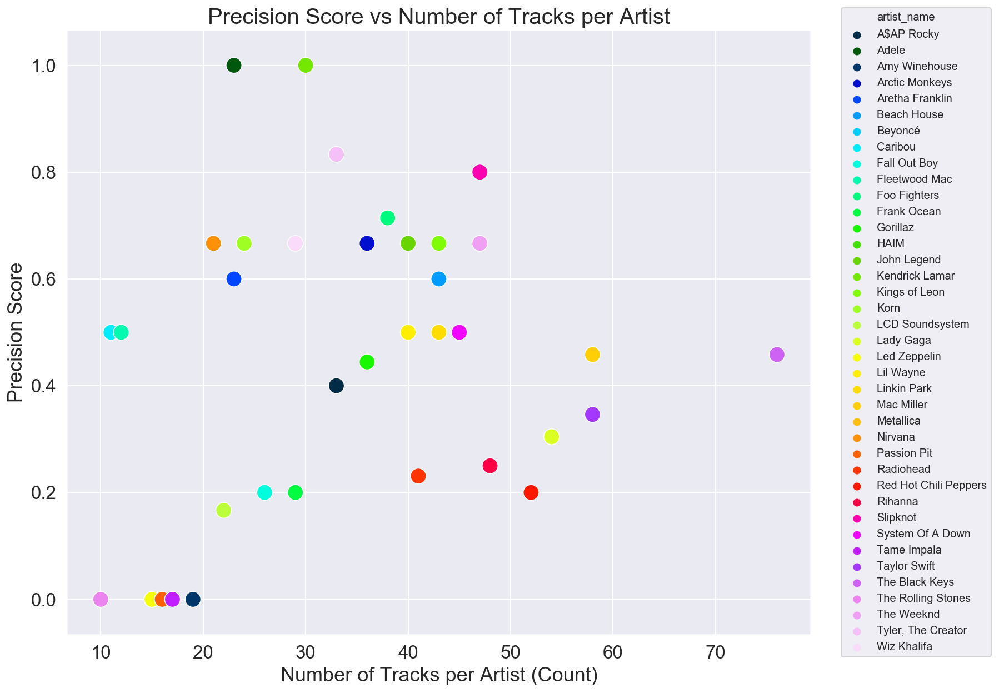

In [68]:
fig, ax = plt.subplots(figsize=(12,10))
sns.scatterplot(data=classification_report_table, x='track_name', y='precision_score', hue='artist_name', s=200, palette='gist_ncar');
#sns.scatterplot(data=artist_count, x='track_name', y='recall_score', hue='artist_name', palette='Blues');
#sns.scatterplot(data=artist_count, x='track_name', y='f1_score', hue='artist_name', palette='Greens');
ax.set_xlabel('Number of Tracks per Artist (Count)');
ax.set_ylabel('Precision Score');
plt.title("Precision Score vs Number of Tracks per Artist", size=20)
ax.legend(loc='right', bbox_to_anchor=(1.25, 0.5), ncol=1, fontsize='medium')
plt.show()

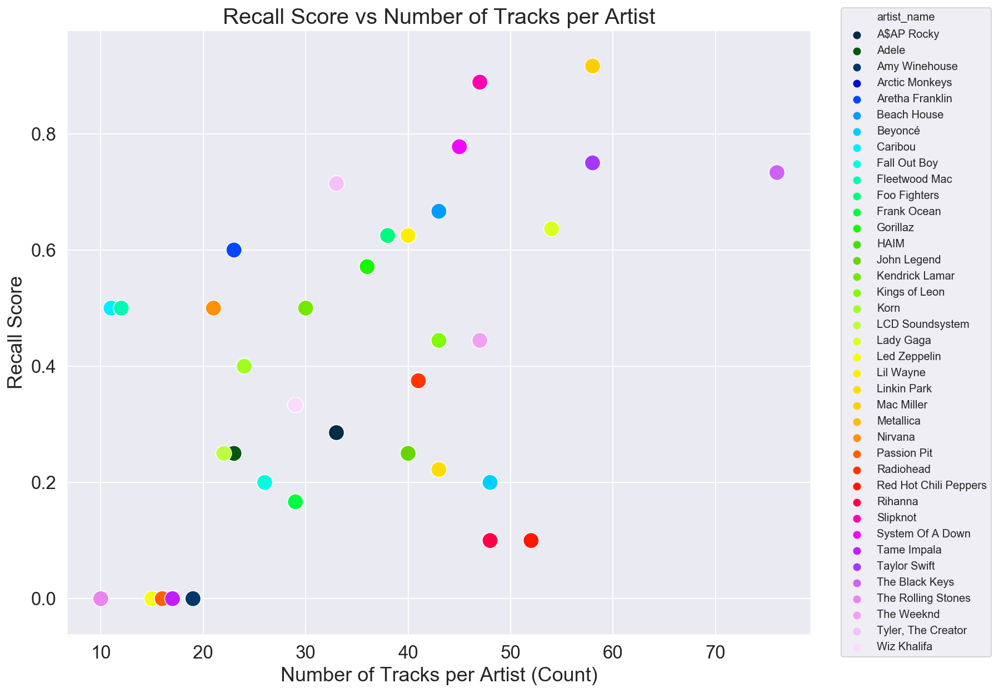

In [69]:
fig, ax = plt.subplots(figsize=(12,10))
#sns.scatterplot(data=artist_count, x='track_name', y='precision_score', hue='artist_name', palette='Reds');
sns.scatterplot(data=classification_report_table, x='track_name', y='recall_score', hue='artist_name', s=200, palette='gist_ncar');
#sns.scatterplot(data=artist_count, x='track_name', y='f1_score', hue='artist_name', palette='Greens');
ax.set_xlabel('Number of Tracks per Artist (Count)');
ax.set_ylabel('Recall Score');
plt.title("Recall Score vs Number of Tracks per Artist", size=20)
ax.legend(loc='right', bbox_to_anchor=(1.25, 0.5), ncol=1, fontsize='medium')
plt.show()

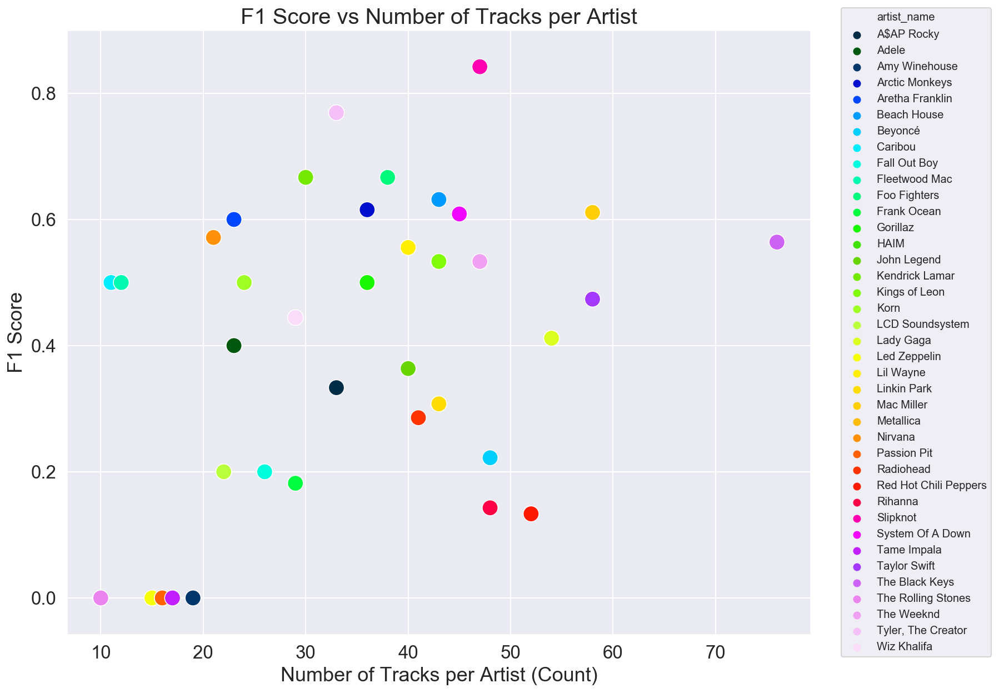

In [70]:
fig, ax = plt.subplots(figsize=(12,10))
#sns.scatterplot(data=classification_report_table, x='track_name', y='precision_score', hue='artist_name', palette='Reds');
#sns.scatterplot(data=classification_report_table, x='track_name', y='recall_score', hue='artist_name', palette='gist_ncar');
sns.scatterplot(data=classification_report_table, x='track_name', y='f1_score', hue='artist_name', s=200, palette='gist_ncar');
ax.set_xlabel('Number of Tracks per Artist (Count)');
ax.set_ylabel('F1 Score');
plt.title("F1 Score vs Number of Tracks per Artist", size=20)
ax.legend(loc='right', bbox_to_anchor=(1.25, 0.5), ncol=1, fontsize='medium')
plt.show()

**Alternative Confusion Matrix**

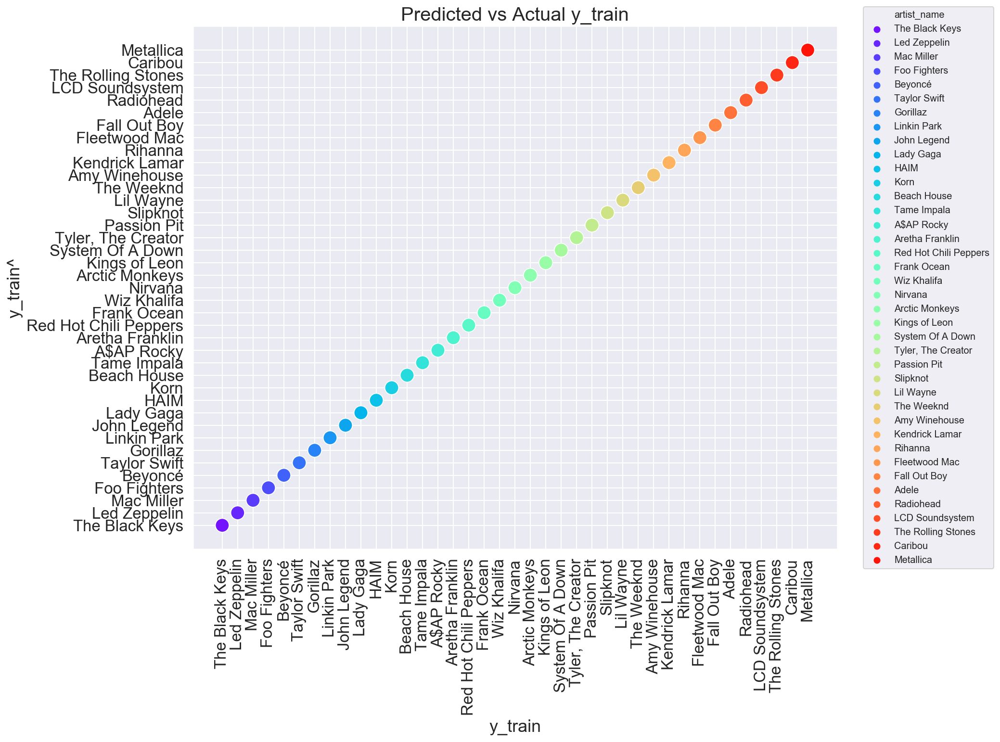

In [71]:
fig, ax = plt.subplots(figsize=(12,10))
sns.scatterplot(x=y_train_t, y=predict_train, hue=y_train_t, s=200, palette='rainbow');
ax.set_xlabel('y_train');
ax.set_xticklabels(labels=y_train.unique(), rotation=90)
ax.set_ylabel('y_train^');
plt.title("Predicted vs Actual y_train", size=20)
ax.legend(loc='right', bbox_to_anchor=(1.25, 0.5), ncol=1, fontsize='medium')
plt.show()

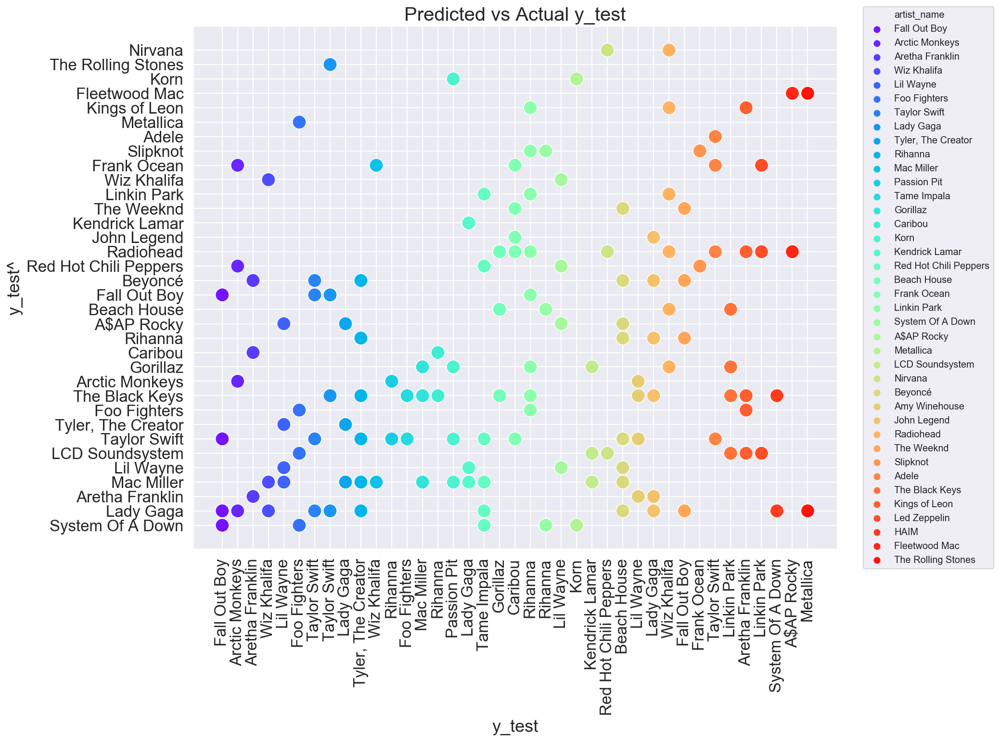

In [72]:
fig, ax = plt.subplots(figsize=(12,10))
sns.scatterplot(x=y_test_t, y=predict_test, hue=y_test_t, s=200, palette='rainbow');
ax.set_xlabel('y_test');
ax.set_xticklabels(labels=y_test_t, rotation=90)
#ax.set_yticklabels(labels=predict_test, rotation=0);
ax.set_ylabel('y_test^');
plt.title("Predicted vs Actual y_test", size=20)
ax.legend(loc='right', bbox_to_anchor=(1.25, 0.5), ncol=1, fontsize='medium')
plt.show()

**ROC Curve**

* Computed ROC Curve by binarizing the classes with the label_binarize( ) function. This is neccessary for multi-label classification.

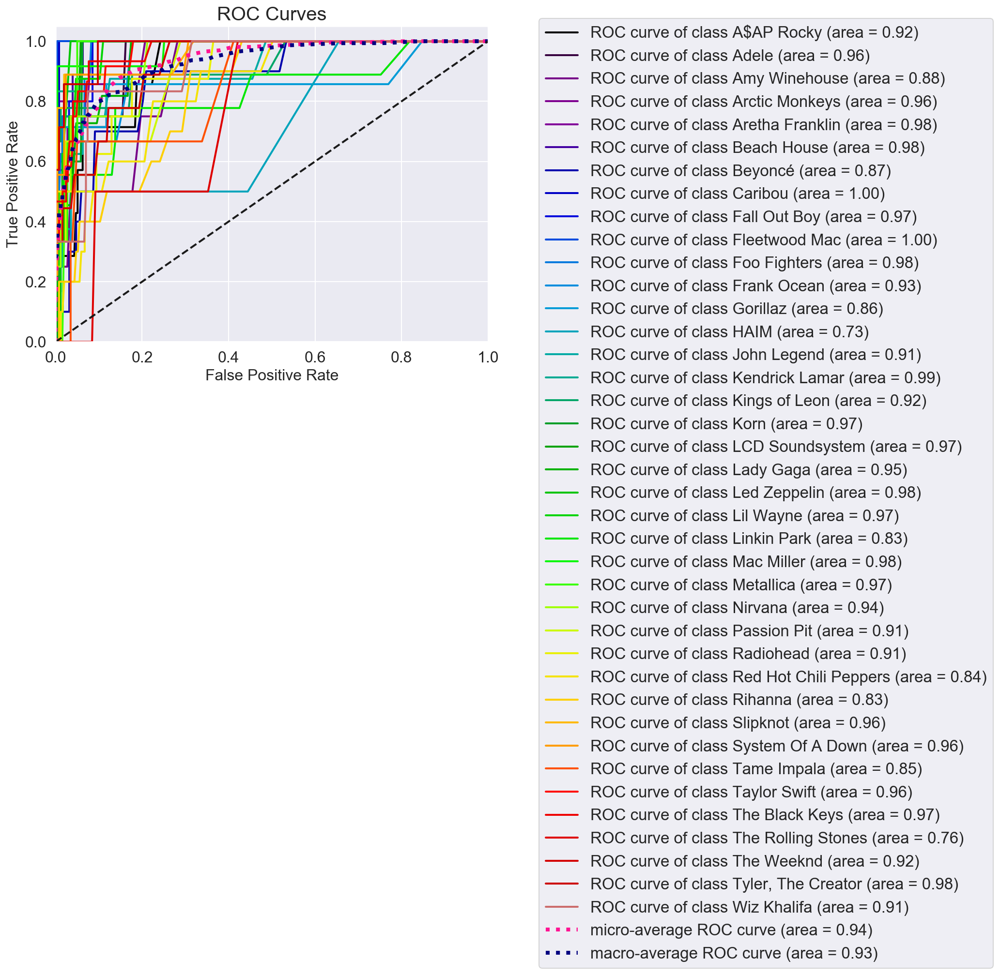

Area under ROC curve (ROC-AUC):
Class A$AP Rocky: 0.92
Class Adele: 0.96
Class Amy Winehouse: 0.88
Class Arctic Monkeys: 0.96
Class Aretha Franklin: 0.98
Class Beach House: 0.98
Class Beyoncé: 0.87
Class Caribou: 1.0
Class Fall Out Boy: 0.97
Class Fleetwood Mac: 1.0
Class Foo Fighters: 0.98
Class Frank Ocean: 0.93
Class Gorillaz: 0.86
Class HAIM: 0.73
Class John Legend: 0.91
Class Kendrick Lamar: 0.99
Class Kings of Leon: 0.92
Class Korn: 0.97
Class LCD Soundsystem: 0.97
Class Lady Gaga: 0.95
Class Led Zeppelin: 0.98
Class Lil Wayne: 0.97
Class Linkin Park: 0.83
Class Mac Miller: 0.98
Class Metallica: 0.97
Class Nirvana: 0.94
Class Passion Pit: 0.91
Class Radiohead: 0.91
Class Red Hot Chili Peppers: 0.84
Class Rihanna: 0.83
Class Slipknot: 0.96
Class System Of A Down: 0.96
Class Tame Impala: 0.85
Class Taylor Swift: 0.96
Class The Black Keys: 0.97
Class The Rolling Stones: 0.76
Class The Weeknd: 0.92
Class Tyler, The Creator: 0.98
Class Wiz Khalifa: 0.91


In [73]:
y_test_bin = label_binarize(y_test_t, best_500.classes_)

skplt.metrics.plot_roc(y_test_t,
                       best_500.predict_proba(X_test_500),
                       plot_micro=True,
                       plot_macro=True,
                       title_fontsize=20,
                       text_fontsize=16,
                       figsize=(8, 6))

plt.legend(bbox_to_anchor=(1.1, 1.05))
plt.show()

print('Area under ROC curve (ROC-AUC):')
for i, class_ in enumerate(best_500.classes_):
    print(
        'Class {}:'.format(class_),
        round(
            roc_auc_score(y_test_bin[:, i],
                          best_500.predict_proba(X_test_500)[:, i]), 2))

**Precision-Recall Curve**

* One-versus-rest classifier using the optimised random forest as an estimator was fit on the reduced X_train and y_train.

In [74]:
clf = OneVsRestClassifier(best_500)
clf.fit(X_train_500, y_train_t)

OneVsRestClassifier(estimator=RandomForestClassifier(bootstrap=True,
                                                     class_weight='balanced',
                                                     criterion='gini',
                                                     max_depth=100,
                                                     max_features=100,
                                                     max_leaf_nodes=None,
                                                     min_impurity_decrease=0.0,
                                                     min_impurity_split=None,
                                                     min_samples_leaf=1,
                                                     min_samples_split=2,
                                                     min_weight_fraction_leaf=0.0,
                                                     n_estimators=500,
                                                     n_jobs=None,
                                            


* Number of classes was defined.
* Precision and recall for each individual class versse rest was calculated by its binarized classes and probabilities.
* The average precision of each class was calculated and added to the legend.

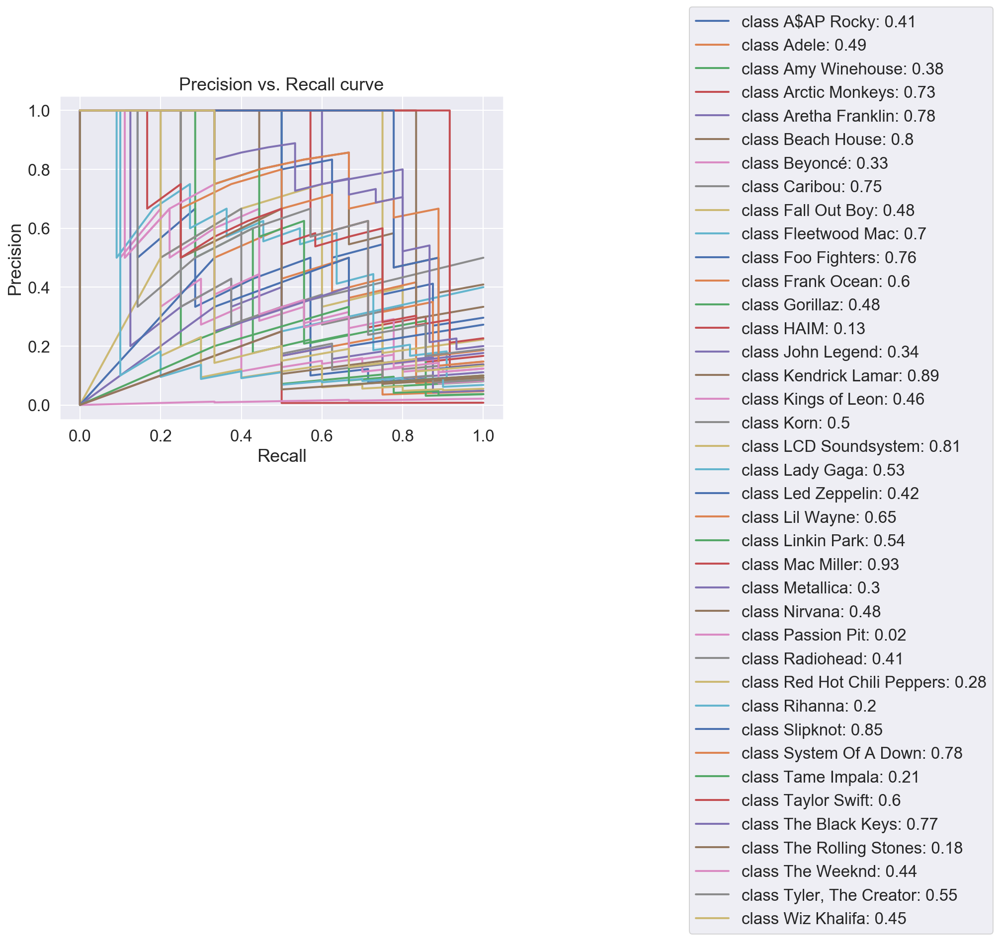

In [75]:
n_classes = len(set(y_test_t))

precision = dict()
recall = dict()
average_precision = dict()

plt.figure(figsize=(8,6))

for i, j in zip(range(n_classes), best_500.classes_):
    precision[i], recall[i], _ = precision_recall_curve(y_test_bin[:, i],
                                                        clf.predict_proba(X_test_500)[:, i])
    average_precision[i] = average_precision_score(y_test_bin[:, i],
                                                        clf.predict_proba(X_test_500)[:, i])
    plt.plot(recall[i], precision[i], lw=2, label='class {}: {}'.format(j, round(average_precision[i],2)))


plt.xlabel("Recall")
plt.ylabel("Precision")
plt.legend(bbox_to_anchor=(1.4, 1.3))
plt.title("Precision vs. Recall curve")
plt.show()

* scikit learn has a plotting function that eases the plotting of multi-class precision recall curves in the one verses rest scenario
* The micro average sums all true positives and divides by the sum of all true positive and false positives

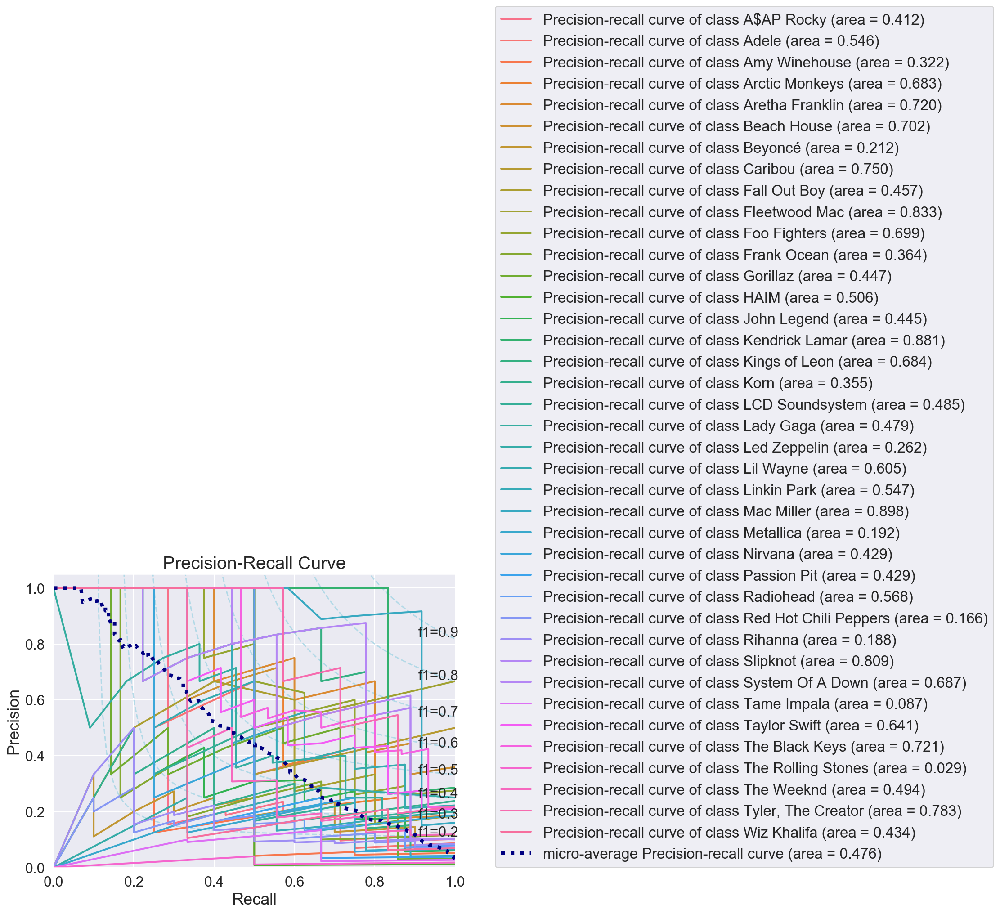

Area under precision-recall curve:
Class A$AP Rocky: 0.41
Class Adele: 0.55
Class Amy Winehouse: 0.32
Class Arctic Monkeys: 0.68
Class Aretha Franklin: 0.72
Class Beach House: 0.7
Class Beyoncé: 0.21
Class Caribou: 0.75
Class Fall Out Boy: 0.46
Class Fleetwood Mac: 0.83
Class Foo Fighters: 0.7
Class Frank Ocean: 0.36
Class Gorillaz: 0.45
Class HAIM: 0.51
Class John Legend: 0.45
Class Kendrick Lamar: 0.88
Class Kings of Leon: 0.68
Class Korn: 0.36
Class LCD Soundsystem: 0.49
Class Lady Gaga: 0.48
Class Led Zeppelin: 0.26
Class Lil Wayne: 0.61
Class Linkin Park: 0.55
Class Mac Miller: 0.9
Class Metallica: 0.19
Class Nirvana: 0.43
Class Passion Pit: 0.43
Class Radiohead: 0.57
Class Red Hot Chili Peppers: 0.17
Class Rihanna: 0.19
Class Slipknot: 0.81
Class System Of A Down: 0.69
Class Tame Impala: 0.09
Class Taylor Swift: 0.64
Class The Black Keys: 0.72
Class The Rolling Stones: 0.03
Class The Weeknd: 0.49
Class Tyler, The Creator: 0.78
Class Wiz Khalifa: 0.43


In [76]:
cmap = ListedColormap(sns.color_palette("husl", len(best_500.classes_)))

fig, ax = plot_f1_lines()
skplt.metrics.plot_precision_recall(y_test_t,
                                    best_500.predict_proba(X_test_500),
                                    plot_micro=True,
                                    title_fontsize=20,
                                    text_fontsize=16,
                                    figsize=(8, 6),
                                    cmap=cmap,
                                    ax=ax)
ax.legend(loc=[1.1, 0])
plt.show()

print('Area under precision-recall curve:')
for i, class_ in enumerate(best_500.classes_):
    print(
        'Class {}:'.format(class_),
        round(
            metrics.average_precision_score(
                y_test_bin[:, i],
                best_500.predict_proba(X_test_500)[:, i]), 2))

**Feature Importance**

In [77]:
feature_import = pd.DataFrame({'feature': np.array(X_train_500.columns), 'importance':best_500.feature_importances_})
feature_import.head()

,feature,importance
0,popularity,0.028748
1,loudness,0.031972
2,duration_ms,0.028654
3,acousticness,0.031844
4,unique_word_count,0.026490


In [78]:
feature_sorted = feature_import.sort_values('importance', ascending=False)[:30]

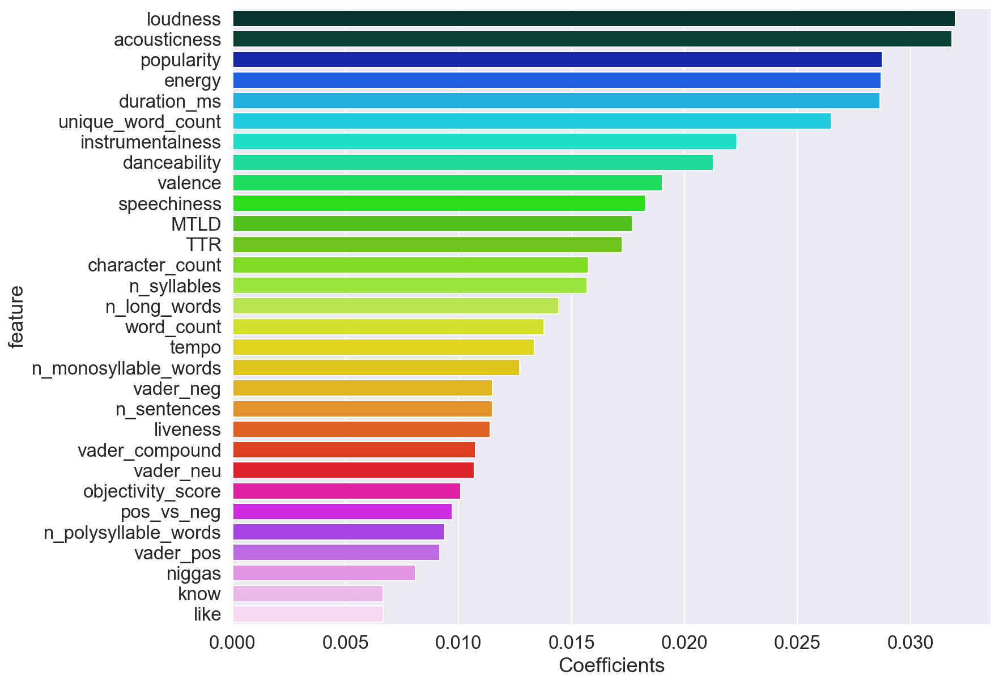

In [79]:
fig, ax = plt.subplots(figsize=(12,10))
sns.barplot(data=feature_sorted, y='feature', x='importance', orient='h', palette='gist_ncar')
ax.set(xlabel='Coefficients')
ax.set_yticklabels(labels=feature_sorted.feature);

## Increased Dataset to 1615 Total Rows

This dataset has a **baseline** of 0.0724.

In [80]:
complete = pd.read_csv('/Users/constancemaurer/GA DSI 12/DSI12-lessons/projects/project-capstone/part-04/Big_model_data.csv')
big_train = pd.read_csv('/Users/constancemaurer/GA DSI 12/DSI12-lessons/projects/project-capstone/part-04/big_train_set.csv')
big_test = pd.read_csv('/Users/constancemaurer/GA DSI 12/DSI12-lessons/projects/project-capstone/part-04/big_test_set.csv')

In [81]:
y_train = big_train.pop('artist_name')
X_train = big_train.copy()

In [82]:
y_test = big_test.pop('artist_name')
X_test = big_test.copy()

In [83]:
X_train = dummyifying(X_train, ['key', 'time_signature','mode'])
X_test = dummyifying(X_test, ['key', 'time_signature','mode'])

In [84]:
X_train_t, y_train_t, X_test_t, y_test_t = tvec_processing('lyrics_processed', X_train, y_train, X_test, y_test)

In [85]:
X_train_t.drop('lyrics_processed', axis=1, inplace=True)
X_test_t.drop('lyrics_processed', axis=1, inplace=True)

In [86]:
X_train_t, X_test_t = StandardScaler_processing(X_train_t, X_test_t)

### Random Forest Summariaed Optimisation

In [87]:
rf = RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=40, max_features=150, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=500,
                       n_jobs=None, oob_score=False, random_state=42, verbose=0,
                       warm_start=False)

In [88]:
rf.fit(X_train_t, y_train_t)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=40, max_features=150, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=500,
                       n_jobs=None, oob_score=False, random_state=42, verbose=0,
                       warm_start=False)

In [89]:
feature_import = pd.DataFrame({'feature': np.array(X_train_t.columns), 'importance':rf.feature_importances_})

**Reducing features to 200 most important ones:**

In [90]:
features_list = []
for i in feature_import.sort_values('importance', ascending=False)[:200].feature:
    features_list.append(i)

In [91]:
cross_val_score(rf, X_train_t, y_train_t, cv=5).mean()

0.4798750821711539

In [92]:
X_train_reduced = X_train_t[features_list]

In [93]:
X_test_reduced = X_test_t[features_list]

In [94]:
random_forest = RandomForestClassifier(random_state=42)

In [95]:
params = {'class_weight':['balanced'],
         'n_estimators':[500],
         'criterion': ['gini'],
         'max_depth': [None, 25, 50, 75],
         'max_features': [None, 50, 90 ,100, 120, 150]}

In [96]:
random_grid = GridSearchCV(random_forest,
                           param_grid=params,
                           scoring='accuracy'
                           cv=5,
                           n_jobs=2,
                           verbose=1,
                           iid=False)
random_grid.fit(X_train_reduced, y_train_t)
random_grid.best_estimator_

Fitting 5 folds for each of 24 candidates, totalling 120 fits


[Parallel(n_jobs=2)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  46 tasks      | elapsed:  6.2min
[Parallel(n_jobs=2)]: Done 120 out of 120 | elapsed: 16.3min finished


RandomForestClassifier(bootstrap=True, class_weight='balanced',
                       criterion='gini', max_depth=25, max_features=120,
                       max_leaf_nodes=None, min_impurity_decrease=0.0,
                       min_impurity_split=None, min_samples_leaf=1,
                       min_samples_split=2, min_weight_fraction_leaf=0.0,
                       n_estimators=500, n_jobs=None, oob_score=False,
                       random_state=42, verbose=0, warm_start=False)

In [98]:
random_grid.best_score_

0.507995973755083

In [100]:
best_rand = random_grid.best_estimator_

In [101]:
print('Cross validation score:')
print(cross_val_score(best_rand, X_train_reduced, y_train_t, cv=5, scoring='accuracy').mean())
print('Training accuracy score:')
print(best_rand.score(X_train_reduced, y_train_t))
print('Testing accuracy score:')
print(best_rand.score(X_test_reduced, y_test_t))

Cross validation score:
0.507995973755083
Training accuracy score:
1.0
Testing accuracy score:
0.5139318885448917


### Evaluation

In [102]:
best_rand = RandomForestClassifier(bootstrap=True, class_weight='balanced',
                       criterion='gini', max_depth=25, max_features=120,
                       max_leaf_nodes=None, min_impurity_decrease=0.0,
                       min_impurity_split=None, min_samples_leaf=1,
                       min_samples_split=2, min_weight_fraction_leaf=0.0,
                       n_estimators=500, n_jobs=None, oob_score=False,
                       random_state=42, verbose=0, warm_start=False)
best_rand.fit(X_train_reduced, y_train_t)

RandomForestClassifier(bootstrap=True, class_weight='balanced',
                       criterion='gini', max_depth=25, max_features=120,
                       max_leaf_nodes=None, min_impurity_decrease=0.0,
                       min_impurity_split=None, min_samples_leaf=1,
                       min_samples_split=2, min_weight_fraction_leaf=0.0,
                       n_estimators=500, n_jobs=None, oob_score=False,
                       random_state=42, verbose=0, warm_start=False)

In [103]:
predict_train = best_rand.predict(X_train_reduced)
predict_test = best_rand.predict(X_test_reduced)

In [104]:
cmap = ListedColormap(sns.color_palette("husl", len(best_rand.classes_)))

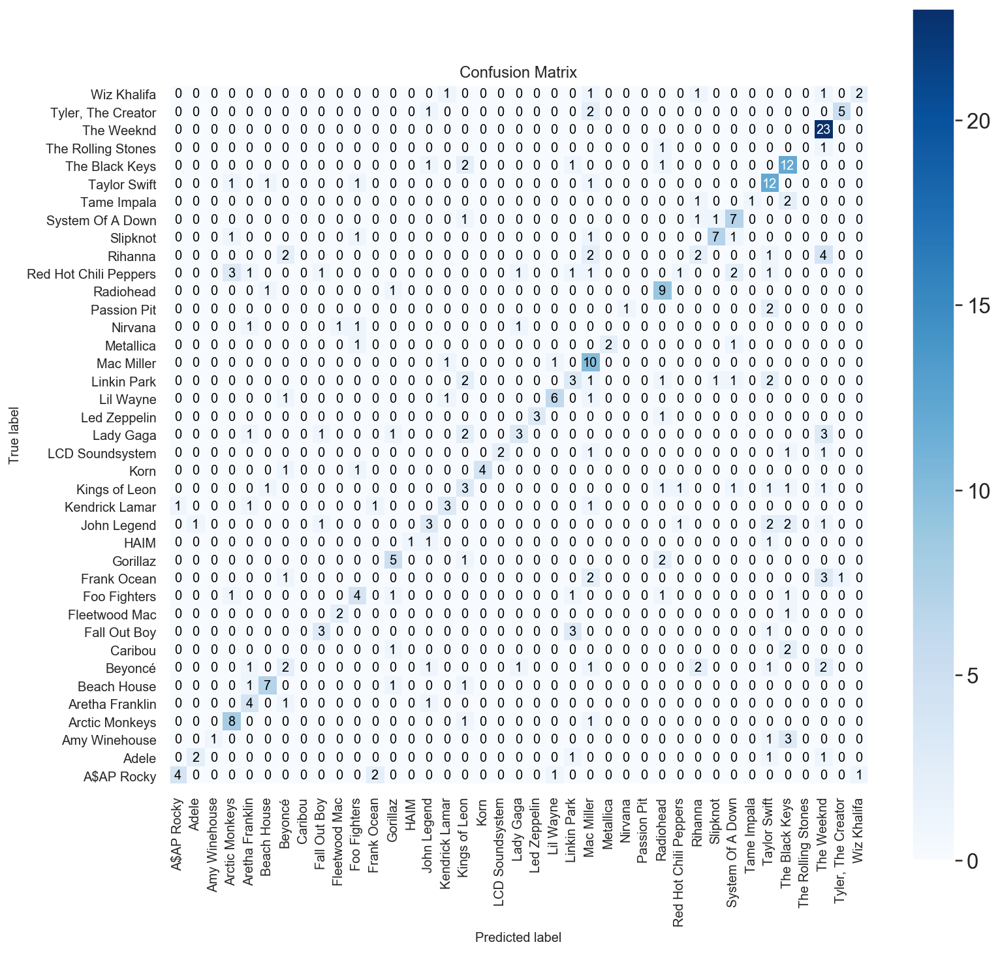

In [105]:
skplt.metrics.plot_confusion_matrix(y_test_t, predict_test, figsize=(12,12))
plt.ylim([-0.5, len(y_train_t.unique())-0.5])
plt.xticks(rotation=90)
plt.show()

In [106]:
print(classification_report(y_test_t, predict_test))

                       precision    recall  f1-score   support

           A$AP Rocky       0.80      0.50      0.62         8
                Adele       0.67      0.40      0.50         5
        Amy Winehouse       1.00      0.20      0.33         5
       Arctic Monkeys       0.57      0.80      0.67        10
      Aretha Franklin       0.40      0.67      0.50         6
          Beach House       0.70      0.70      0.70        10
              Beyoncé       0.25      0.18      0.21        11
              Caribou       0.00      0.00      0.00         3
         Fall Out Boy       0.50      0.43      0.46         7
        Fleetwood Mac       0.67      0.67      0.67         3
         Foo Fighters       0.44      0.44      0.44         9
          Frank Ocean       0.00      0.00      0.00         7
             Gorillaz       0.50      0.62      0.56         8
                 HAIM       1.00      0.33      0.50         3
          John Legend       0.38      0.27      0.32  

In [107]:
classification_report_table = complete.groupby('artist_name').count()[['track_name']]
classification_report_table.reset_index(inplace=True)

In [108]:
precision, recall, f1, support = precision_recall_fscore_support(y_test_t, predict_test, average=None)

In [109]:
classification_report_table['precision_score'] = precision
classification_report_table['recall_score'] = recall
classification_report_table['f1_score'] = f1
classification_report_table['n_samples_test_set'] = support
classification_report_table

,artist_name,track_name,precision_score,recall_score,f1_score,n_samples_test_set
0,A$AP Rocky,41,0.800000,0.500000,0.615385,8
1,Adele,24,0.666667,0.400000,0.500000,5
2,Amy Winehouse,25,1.000000,0.200000,0.333333,5
3,Arctic Monkeys,48,0.571429,0.800000,0.666667,10
4,Aretha Franklin,31,0.400000,0.666667,0.500000,6
5,Beach House,50,0.700000,0.700000,0.700000,10
6,Beyoncé,57,0.250000,0.181818,0.210526,11
7,Caribou,13,0.000000,0.000000,0.000000,3
8,Fall Out Boy,33,0.500000,0.428571,0.461538,7
9,Fleetwood Mac,13,0.666667,0.666667,0.666667,3


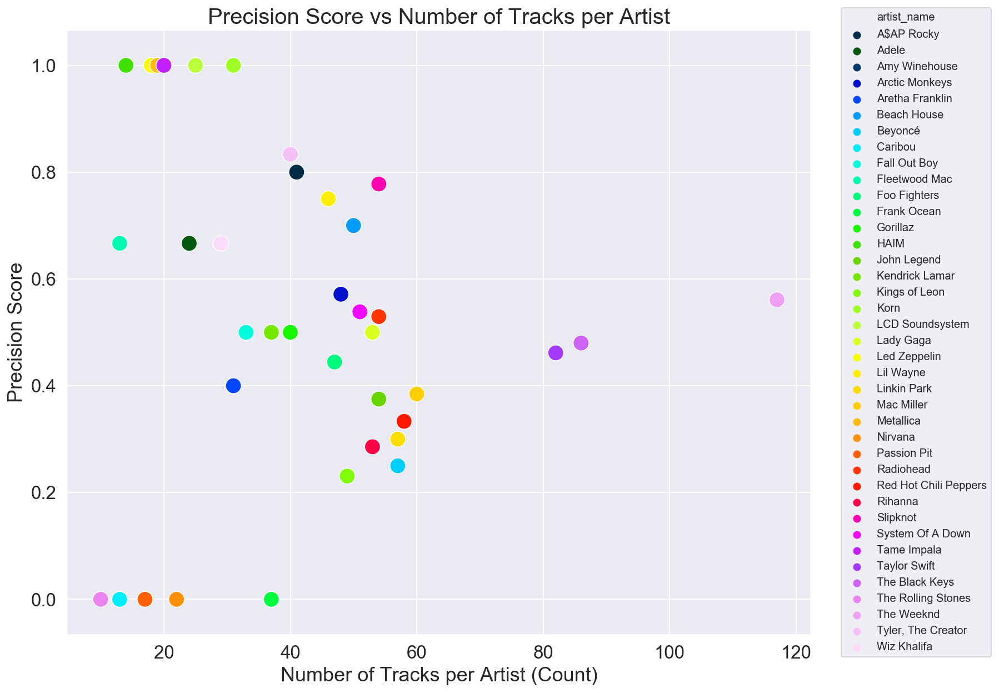

In [110]:
fig, ax = plt.subplots(figsize=(12,10))
sns.scatterplot(data=classification_report_table, x='track_name', y='precision_score', hue='artist_name', s=200, palette='gist_ncar');
#sns.scatterplot(data=artist_count, x='track_name', y='recall_score', hue='artist_name', palette='Blues');
#sns.scatterplot(data=artist_count, x='track_name', y='f1_score', hue='artist_name', palette='Greens');
ax.set_xlabel('Number of Tracks per Artist (Count)');
ax.set_ylabel('Precision Score');
plt.title("Precision Score vs Number of Tracks per Artist", size=20)
ax.legend(loc='right', bbox_to_anchor=(1.25, 0.5), ncol=1, fontsize='medium')
plt.show()

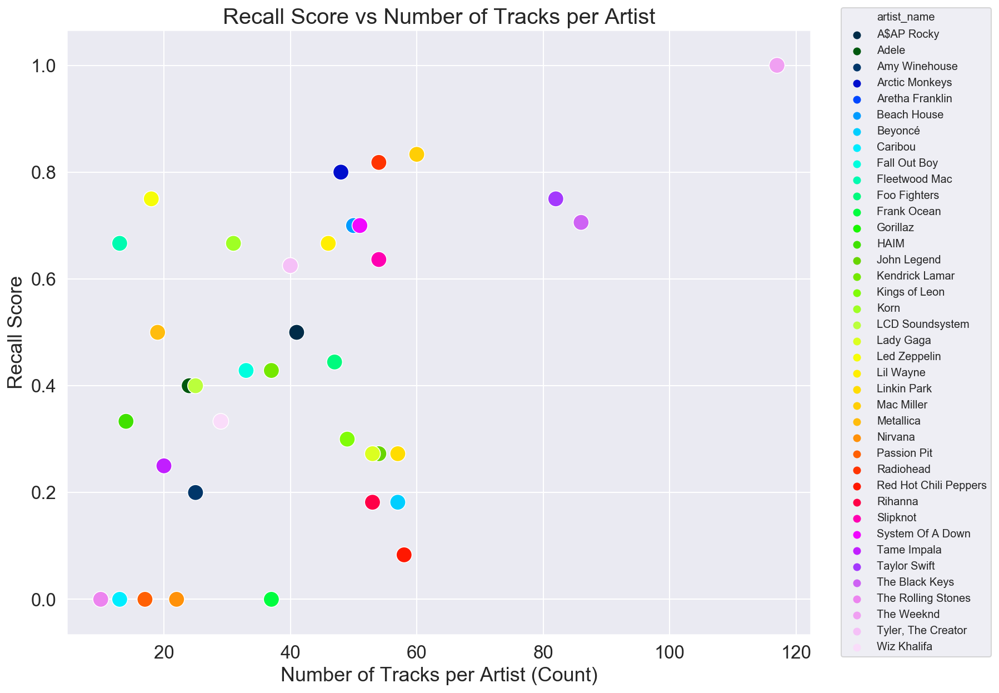

In [111]:
fig, ax = plt.subplots(figsize=(12,10))
#sns.scatterplot(data=artist_count, x='track_name', y='precision_score', hue='artist_name', palette='Reds');
sns.scatterplot(data=classification_report_table, x='track_name', y='recall_score', hue='artist_name', s=200, palette='gist_ncar');
#sns.scatterplot(data=artist_count, x='track_name', y='f1_score', hue='artist_name', palette='Greens');
ax.set_xlabel('Number of Tracks per Artist (Count)');
ax.set_ylabel('Recall Score');
plt.title("Recall Score vs Number of Tracks per Artist", size=20)
ax.legend(loc='right', bbox_to_anchor=(1.25, 0.5), ncol=1, fontsize='medium')
plt.show()

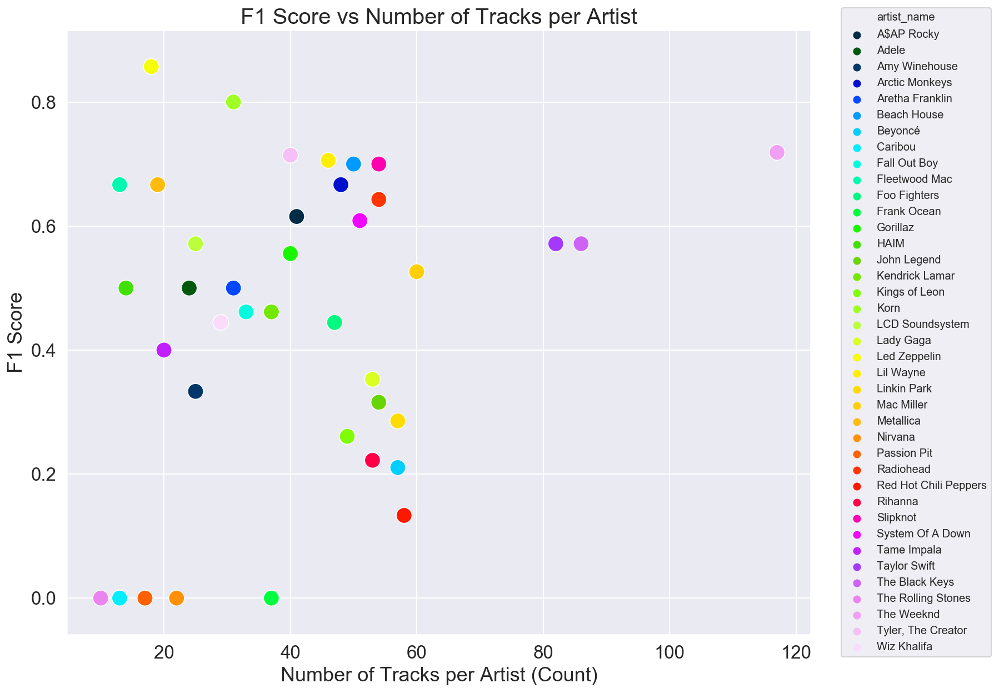

In [112]:
fig, ax = plt.subplots(figsize=(12,10))
#sns.scatterplot(data=classification_report_table, x='track_name', y='precision_score', hue='artist_name', palette='Reds');
#sns.scatterplot(data=classification_report_table, x='track_name', y='recall_score', hue='artist_name', palette='gist_ncar');
sns.scatterplot(data=classification_report_table, x='track_name', y='f1_score', hue='artist_name', s=200, palette='gist_ncar');
ax.set_xlabel('Number of Tracks per Artist (Count)');
ax.set_ylabel('F1 Score');
plt.title("F1 Score vs Number of Tracks per Artist", size=20)
ax.legend(loc='right', bbox_to_anchor=(1.25, 0.5), ncol=1, fontsize='medium')
plt.show()

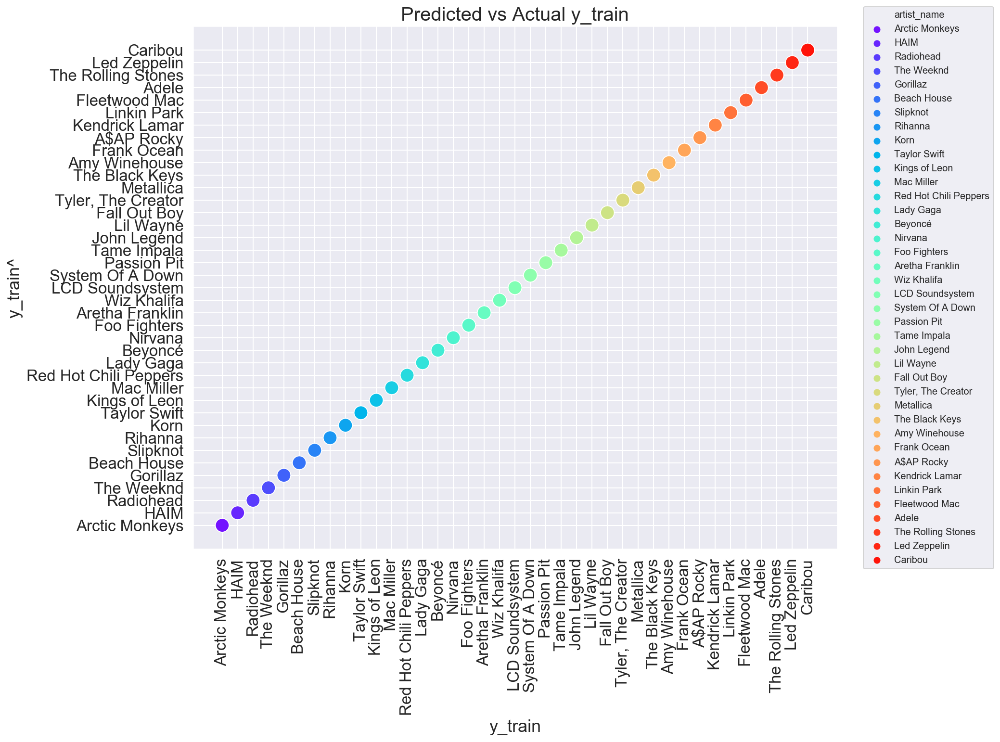

In [113]:
fig, ax = plt.subplots(figsize=(12,10))
sns.scatterplot(x=y_train_t, y=predict_train, hue=y_train_t, s=200, palette='rainbow');
ax.set_xlabel('y_train');
ax.set_xticklabels(labels=y_train_t.unique(), rotation=90)
ax.set_ylabel('y_train^');
plt.title("Predicted vs Actual y_train", size=20)
ax.legend(loc='right', bbox_to_anchor=(1.25, 0.5), ncol=1, fontsize='medium')
plt.show()

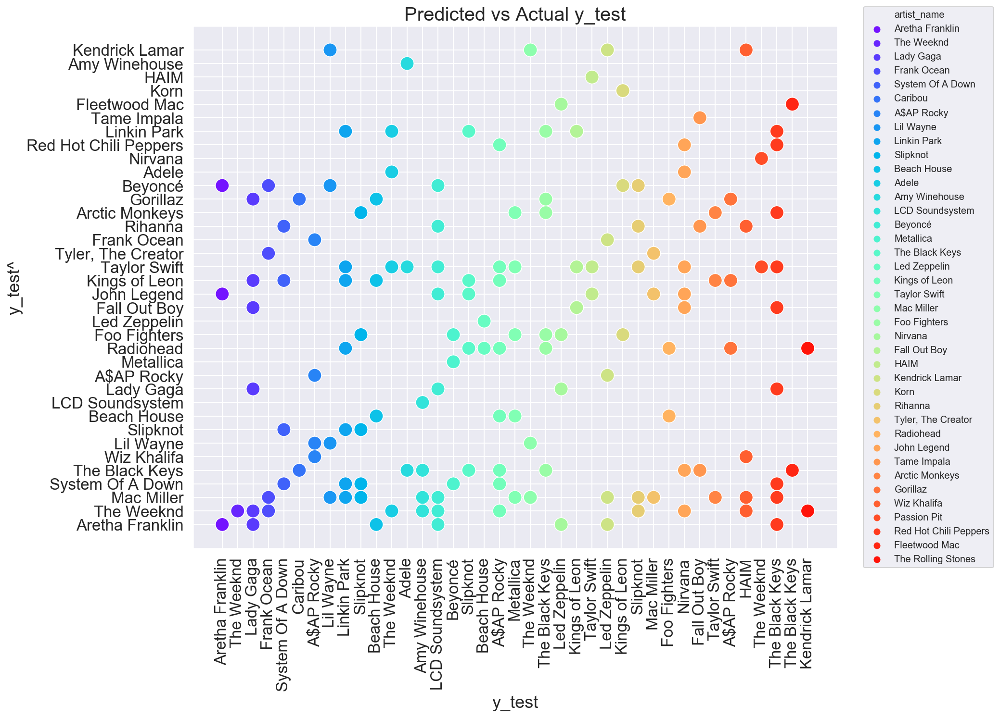

In [114]:
fig, ax = plt.subplots(figsize=(12,10))
sns.scatterplot(x=y_test_t, y=predict_test, hue=y_test_t, s=200, palette='rainbow');
ax.set_xlabel('y_test');
ax.set_xticklabels(labels=y_test_t, rotation=90)
#ax.set_yticklabels(labels=predict_test, rotation=0);
ax.set_ylabel('y_test^');
plt.title("Predicted vs Actual y_test", size=20)
ax.legend(loc='right', bbox_to_anchor=(1.25, 0.5), ncol=1, fontsize='medium')
plt.show()

**ROC Curve with AUC**

* Computed ROC Curve by binarizing the classes with the label_binarize( ) function. This is neccessary for multi-label classification.

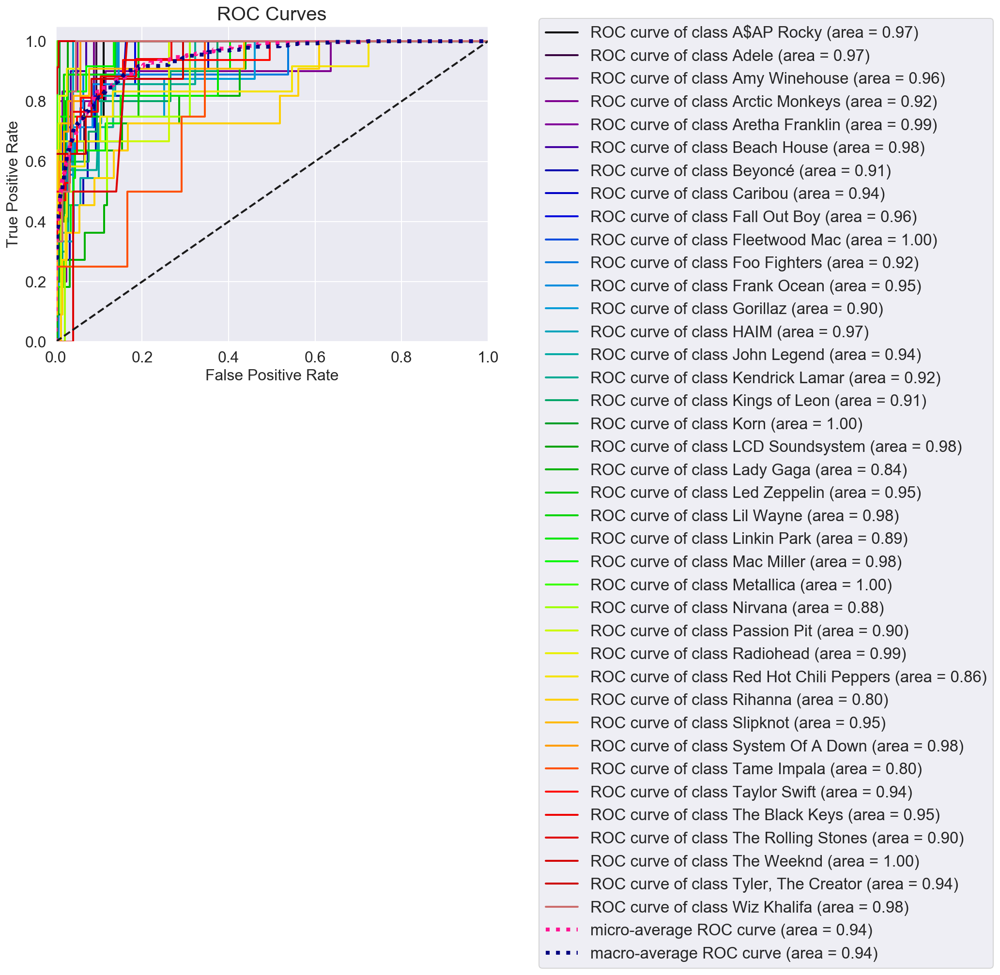

Area under ROC curve (ROC-AUC):
Class A$AP Rocky: 0.97
Class Adele: 0.97
Class Amy Winehouse: 0.96
Class Arctic Monkeys: 0.92
Class Aretha Franklin: 0.99
Class Beach House: 0.98
Class Beyoncé: 0.91
Class Caribou: 0.94
Class Fall Out Boy: 0.96
Class Fleetwood Mac: 1.0
Class Foo Fighters: 0.92
Class Frank Ocean: 0.95
Class Gorillaz: 0.9
Class HAIM: 0.97
Class John Legend: 0.94
Class Kendrick Lamar: 0.92
Class Kings of Leon: 0.91
Class Korn: 1.0
Class LCD Soundsystem: 0.98
Class Lady Gaga: 0.84
Class Led Zeppelin: 0.95
Class Lil Wayne: 0.98
Class Linkin Park: 0.89
Class Mac Miller: 0.98
Class Metallica: 1.0
Class Nirvana: 0.88
Class Passion Pit: 0.9
Class Radiohead: 0.99
Class Red Hot Chili Peppers: 0.86
Class Rihanna: 0.8
Class Slipknot: 0.95
Class System Of A Down: 0.98
Class Tame Impala: 0.8
Class Taylor Swift: 0.94
Class The Black Keys: 0.95
Class The Rolling Stones: 0.9
Class The Weeknd: 1.0
Class Tyler, The Creator: 0.94
Class Wiz Khalifa: 0.98


In [115]:
y_test_bin = label_binarize(y_test_t, best_rand.classes_)

skplt.metrics.plot_roc(y_test_t,
                       best_rand.predict_proba(X_test_reduced),
                       plot_micro=True,
                       plot_macro=True,
                       title_fontsize=20,
                       text_fontsize=16,
                       figsize=(8, 6))

plt.legend(bbox_to_anchor=(1.1, 1.05))
plt.show()

print('Area under ROC curve (ROC-AUC):')
for i, class_ in enumerate(best_rand.classes_):
    print(
        'Class {}:'.format(class_),
        round(
            roc_auc_score(y_test_bin[:, i],
                          best_rand.predict_proba(X_test_reduced)[:, i]), 2))

**Precision-Recall Curve with AUC**

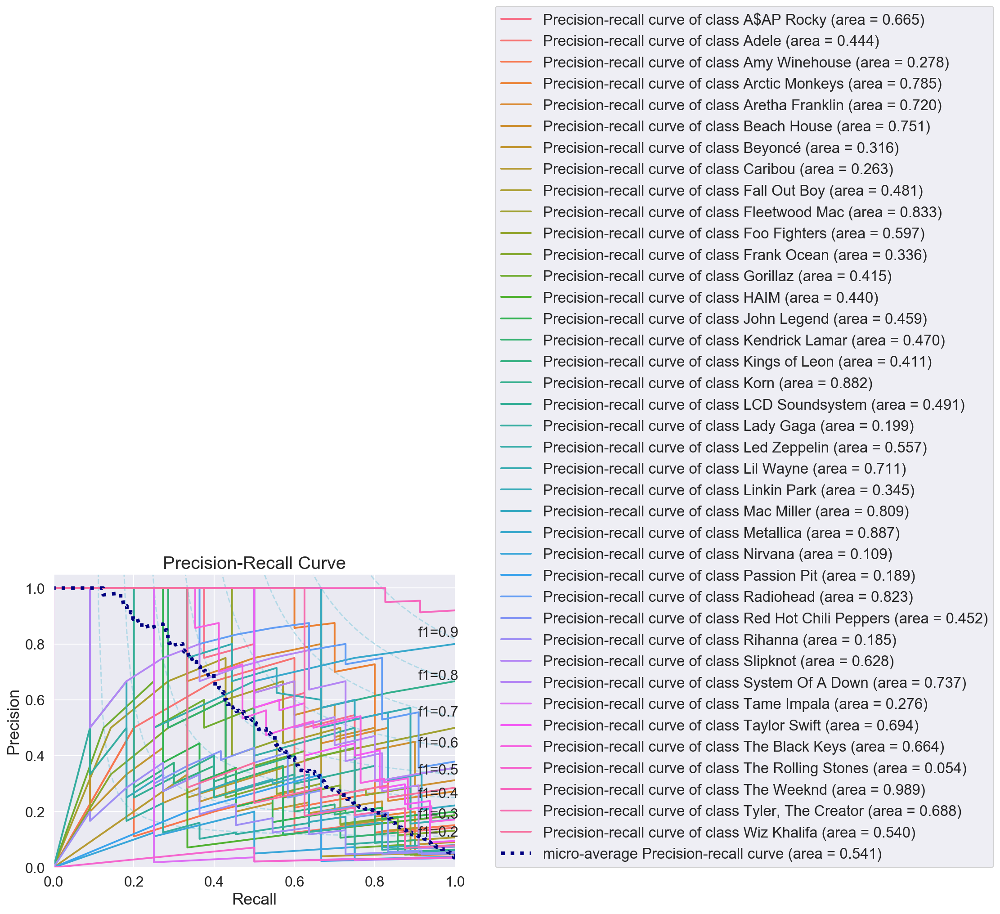

Area under precision-recall curve:
Class A$AP Rocky: 0.67
Class Adele: 0.44
Class Amy Winehouse: 0.28
Class Arctic Monkeys: 0.79
Class Aretha Franklin: 0.72
Class Beach House: 0.75
Class Beyoncé: 0.32
Class Caribou: 0.26
Class Fall Out Boy: 0.48
Class Fleetwood Mac: 0.83
Class Foo Fighters: 0.6
Class Frank Ocean: 0.34
Class Gorillaz: 0.41
Class HAIM: 0.44
Class John Legend: 0.46
Class Kendrick Lamar: 0.47
Class Kings of Leon: 0.41
Class Korn: 0.88
Class LCD Soundsystem: 0.49
Class Lady Gaga: 0.2
Class Led Zeppelin: 0.56
Class Lil Wayne: 0.71
Class Linkin Park: 0.35
Class Mac Miller: 0.81
Class Metallica: 0.89
Class Nirvana: 0.11
Class Passion Pit: 0.19
Class Radiohead: 0.82
Class Red Hot Chili Peppers: 0.45
Class Rihanna: 0.19
Class Slipknot: 0.63
Class System Of A Down: 0.74
Class Tame Impala: 0.28
Class Taylor Swift: 0.69
Class The Black Keys: 0.66
Class The Rolling Stones: 0.05
Class The Weeknd: 0.99
Class Tyler, The Creator: 0.69
Class Wiz Khalifa: 0.54


In [116]:
cmap = ListedColormap(sns.color_palette("husl", len(best_rand.classes_)))

fig, ax = plot_f1_lines()
skplt.metrics.plot_precision_recall(y_test_t,
                                    best_rand.predict_proba(X_test_reduced),
                                    plot_micro=True,
                                    title_fontsize=20,
                                    text_fontsize=16,
                                    figsize=(8, 6),
                                    cmap=cmap,
                                    ax=ax)
ax.legend(loc=[1.1, 0])
plt.show()

print('Area under precision-recall curve:')
for i, class_ in enumerate(best_rand.classes_):
    print(
        'Class {}:'.format(class_),
        round(
            metrics.average_precision_score(
                y_test_bin[:, i],
                best_rand.predict_proba(X_test_reduced)[:, i]), 2))

* Produced CSV file of actual and predicted test data for further use in visualisations such as neural networks.

In [117]:
test_df = pd.DataFrame({'y_test': y_test_t, 'y_test_predicted': predict_test})
test_df.to_csv('test_targets_predictions.csv', index=False)

In [118]:
test_df.head()

,y_test,y_test_predicted
0,Aretha Franklin,Aretha Franklin
1,The Weeknd,The Weeknd
2,Lady Gaga,Aretha Franklin
3,Frank Ocean,Mac Miller
4,System Of A Down,System Of A Down


* Determined feature importance of this optimised model. Among the highest predictors are popularity, loudness, acousticness, unique_word_count, duration_ms and energy. 

In [119]:
feature_import = pd.DataFrame({'feature': np.array(X_train_reduced.columns), 'importance':best_rand.feature_importances_})
feature_import.head()

,feature,importance
0,energy,0.032348
1,acousticness,0.040896
2,loudness,0.044193
3,popularity,0.048432
4,unique_word_count,0.035702


In [120]:
feature_sorted = feature_import.sort_values('importance', ascending=False)[:30]

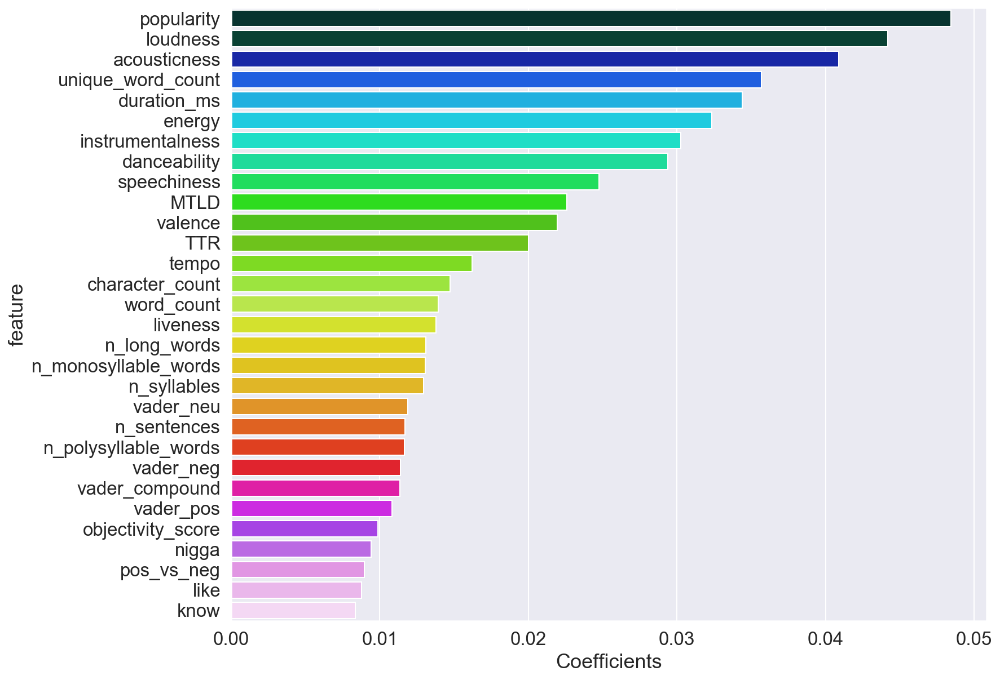

In [121]:
fig, ax = plt.subplots(figsize=(12,10))
sns.barplot(data=feature_sorted, y='feature', x='importance', orient='h', palette='gist_ncar')
ax.set(xlabel='Coefficients')
ax.set_yticklabels(labels=feature_sorted.feature);

## Summary

**Model based on 1312 rows dataset**

Optimisation:
* Random forest optimisation was able to increase the cross-validation score from 0.433 to **0.459** within the same dataset (baseline=0.058) by simply implementing balanced class weights and reducing the predictors/features to the 500 most important ones.


* Features which had the highest coefficients/were able to influence the predictions the strongest were loudness, acousticness, popularity, energy, duration_ms and unique_word_count.


Evaluation: 
* Precision and recall scores were 43% and 39%, respectively, indicating that the model possesses more false negatives than false positives.


* Plotting the precision, recall and F1 scores vs the count of songs per artists, showed that the majority class had higher true positive results than classes with a lower representation.


* Interpreting the ROC curves for all classes most AUCs are above 0.80 with only HAIM and The Rolling Stones having a AUC of 0.73 and 0.76, respectively. These two classes have the lowest representation within the dataset. Nevertheless, Caribou which closely follows them has a perfect score (AUC = 1.00). This could be attributed to specific style or lower popularity.
* Overall, the ROC curves indicate a good ability to separate the different classes which is also illustrated in the macro and micro AUC of 0.93 and 0.94, respectively. 


* Producing the precision-recall curves for all classes in the fashion of one-verses-rest utilising scitkit-learn's precision-recall plotting function, the model is overall performing poorly as seen in the micro AUC of 0.48. The classifier having an PR-AUC close to 0.5 suggests that for every correct prediction, the next will be incorrect.


**Model based on 1615 rows dataset**

Optimisation:
* When increasing the total rows of the data from 1312 to 1615 rows (baseline=0.072) and applying the same optimisation steps (balancing class weights and reducing the features to the top 200), the cross-validation score was able to improve to **0.508**. 


* Feature importance favoured popularity, loudness, acousticness, unique_word_count, duration_ms and energy. It increase the importance of popularity and unique_word_count for example. 
* It is interesting to note that the order of type of features that influence the class prediction seems to be music features, lexical diversity, text statistics, sentiment and then frequency of specific words.


Evaluation:
* Enriching the dataset increased the precision and recall scores to 54% and 55%, respectively. The model is now able to have more complete results (less false negatives - indicated by the increased recall score).


* As in the 1312 data model, the highly represented class have higher precision, recall and F! scores more often than classes with a lower representation.


* Factors increasing the predictability are number of entries per class, uniqueness in music style, the sentiment of the lyrics and lastly the content of words in the lyrics.


* The predictive performance of the classifier was evaluated through the ROC curve. Its AUC of all classes being >0.80 illustrates a model of being able to distinguish the different classes well. This is also represented in the macro and micro ROC-AUCs of 0.94 in both cases. 


* The precision-recall curve produced an evaluation of a poor classifier but performing better than the smaller dataset. The PR-AUC of 0.54 suggests that the model is only able to have a high recall at a low precision. 